In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import random
import os
import glob
import imutils

import lightgbm as lgb

from skimage import util, exposure
from skimage.filters import sobel
from skimage.feature import greycomatrix, greycoprops

from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import tensorflow as tf
from sklearn.metrics import f1_score
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, MaxPooling2D, Dropout, Conv2D

from google.colab.patches import cv2_imshow
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
import PIL
from PIL import Image
import io
from base64 import b64decode, b64encode
import html
import time
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from imutils import contours



Hough Transformation => p = x cos (theta) + y sin (theta)

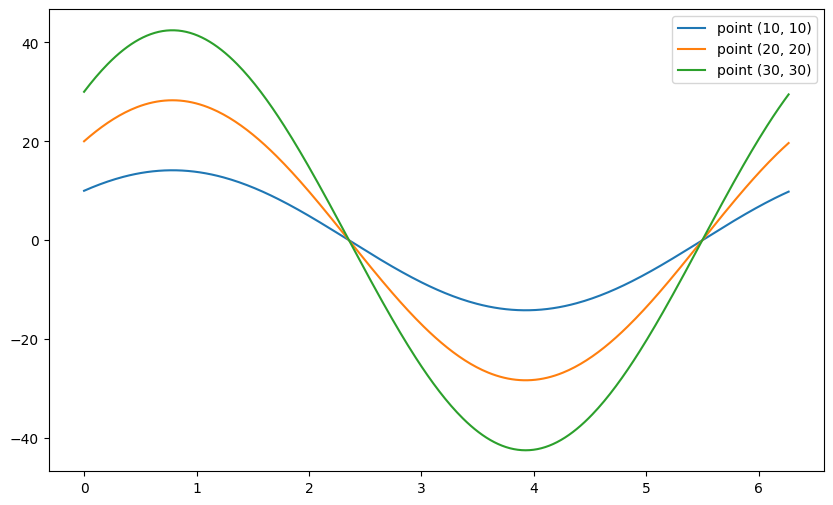

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

points = [(10,10), (20,20), (30,30)]
thetas = np.deg2rad(np.arange(0.0,360.0))

plt.figure(figsize=(10,6))
for (x,y) in points:
  rhos = x * np.cos(thetas) + y * np.sin(thetas)
  plt.plot(thetas, rhos, label=f'point ({x}, {y})')

plt.legend()



Image Manipulation

Binary image: Use threshold ie all pixel values between i and j go to 1 else 0

Morphological Operations:
1. Erosion: erodes edges of foreground by using lowest pixel value in n * n filter
2. Dilated: Expands edges of foreground by using highes pixel valyes in n * n filter
3. Opening: Erosoion then dilation, removes noise from background
4. Closing: Dialtion then erosion: fills holes in foreground
5. Gradient: Difference in dilation and erosion - Boundary of foreground
6. Top_hat: difference between original img and opening
7. Black Hat: difference between original img and closing


Gaussian Blurring: Used to remove noise from image and helps in easing of other kinds of detection based on pixel values

Laplcaian: Second Derivative of Gradients of Image

Sobel X - Edge detection algorithm that finds Vertical Lines in image

Sobel Y - Edge detection algorithm that finds horizontal Lines in image

Canny Edge Detection: Takes image from sobel output, thins them to 1 pixel so find all the fine important edges in image. It does chosing important edges by using hysteris thresholding where you have 2 threshold and upper and lower, everything above the upper threshold is accepted, everythoing below lower is rejected, and for everything in between upper and lower we only chose an edge if it iis connected to something above the upper threshold (accept if connected to accepted)

Harris Corner: We do this by detecting changes in gradients in 2 directions (Look online for deeper explaination)

Hough Transformation: here we sue the fact that objection can be written in polar representation and then voting on what the most likely rho and theta for all possible pairs of point and then chosing points ie lines with the most votes


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/hough.cpp:132: error: (-215:Assertion failed) img.type() == CV_8UC1 in function 'HoughLinesStandard'


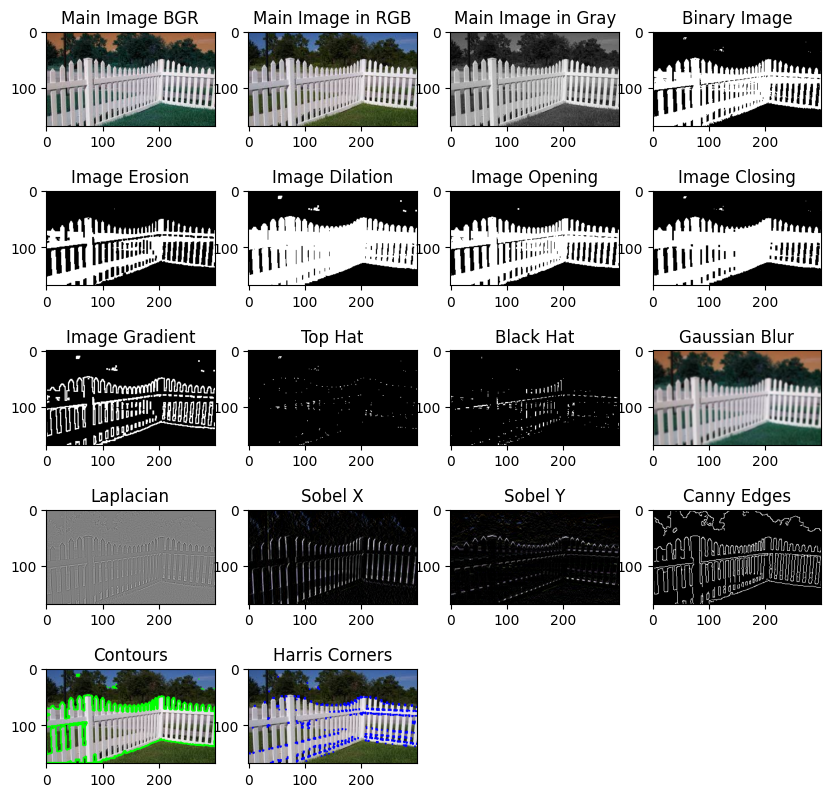

In [ ]:
fig = plt.figure(figsize=(10,10))

row = 5
column = 4

# Open Cv inputs all images in BRG
main_img = cv2.imread("/content/drive/MyDrive/Computer Vision/Texture Finding/download.jpg")
ax1 = fig.add_subplot(row, column, 1)
ax1.imshow(main_img)
ax1.set_title('Main Image BGR')


#RGB img
main_rgb  = cv2.cvtColor(main_img, cv2.COLOR_BGR2RGB)
ax2 = fig.add_subplot(row, column, 2)
ax2.imshow(main_rgb)
ax2.set_title('Main Image in RGB')

# Gray Image
gray_main = cv2.cvtColor(main_img, cv2.COLOR_BGR2GRAY)
ax3 = fig.add_subplot(row, column, 3)
ax3.imshow(gray_main, cmap = "gray")
ax3.set_title('Main Image in Gray')

#Binary Image
ret, img_thresh = cv2.threshold(gray_main, 127, 255, cv2.THRESH_BINARY)
ax4 = fig.add_subplot(row, column, 4)
ax4.imshow(img_thresh, cmap = "gray")
ax4.set_title('Binary Image')

#kernel to perform morphological operations on
kernel = np.ones((3,3), np.uint8)

#Image Erosion
eroded = cv2.erode(img_thresh, kernel, iterations=1)
ax5 = fig.add_subplot(row, column, 5)
ax5.imshow(eroded, cmap = "gray")
ax5.set_title('Image Erosion')

#Image Dilation
dilated = cv2.dilate(img_thresh, kernel, iterations=1)
ax6 = fig.add_subplot(row, column, 6)
ax6.imshow(dilated, cmap = "gray")
ax6.set_title('Image Dilation')

#Image Opening
opening = cv2.morphologyEx(img_thresh, cv2.MORPH_OPEN, kernel)
ax7 = fig.add_subplot(row, column, 7)
ax7.imshow(opening, cmap = "gray")
ax7.set_title('Image Opening')

#Imagge Closing
closing = cv2.morphologyEx(img_thresh, cv2.MORPH_CLOSE, kernel)
ax8 = fig.add_subplot(row, column, 8)
ax8.imshow(closing, cmap = "gray")
ax8.set_title('Image Closing')

#Image Gradient
Gradient = cv2.morphologyEx(img_thresh, cv2.MORPH_GRADIENT, kernel)
ax9 = fig.add_subplot(row, column, 9)
ax9.imshow(Gradient, cmap = "gray")
ax9.set_title('Image Gradient')

#Top Hat
top_hat = cv2.morphologyEx(img_thresh, cv2.MORPH_TOPHAT, kernel)
ax10 = fig.add_subplot(row, column, 10)
ax10.imshow(top_hat, cmap = "gray")
ax10.set_title('Top Hat')

#Black Hat
black_hat = cv2.morphologyEx(img_thresh, cv2.MORPH_BLACKHAT, kernel)
ax11 = fig.add_subplot(row, column, 11)
ax11.imshow(black_hat, cmap = "gray")
ax11.set_title('Black Hat')

# Gaussian Blur
blur = cv2.GaussianBlur(main_img, (5,5), 0)
ax12 = fig.add_subplot(row, column, 12)
ax12.imshow(blur)
ax12.set_title('Gaussian Blur')


#Laplacian
laplacian = cv2.Laplacian(gray_main, cv2.CV_64F)
ax13 = fig.add_subplot(row, column, 13)
ax13.imshow(laplacian, cmap = "gray")
ax13.set_title('Laplacian')

#Sobel_X
edgesx = cv2.Sobel(main_rgb, -1, dx=1, dy=0, ksize=1)
ax14 = fig.add_subplot(row, column, 14)
ax14.imshow(edgesx, cmap = "gray")
ax14.set_title('Sobel X')

#Sobel Y
edgesy = cv2.Sobel(main_rgb, -1, dx=0, dy=1, ksize=1)
ax15 = fig.add_subplot(row, column, 15)
ax15.imshow(edgesy, cmap = "gray")
ax15.set_title('Sobel Y')


#canny edges
canny = cv2.Canny(blur, 100, 200)
ax16 = fig.add_subplot(row, column, 16)
ax16.imshow(canny, cmap = "gray")
ax16.set_title('Canny Edges')

#Contours
countours, heirarchy = cv2.findContours(img_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = main_rgb.copy()
cv2.drawContours(contour_img, countours, -1, (0,255,0), 2)
ax17 = fig.add_subplot(row, column, 17)
ax17.imshow(contour_img)
ax17.set_title('Contours')

#harris Corners
gray_float = np.float32(gray_main)
dst = cv2.cornerHarris(gray_float, 2, 3, 0.04)
dst = cv2.dilate(dst, None)
main_rgb[dst > 0.01 * dst.max()] = [0, 0, 255]
ax18 = fig.add_subplot(row, column, 18)
ax18.imshow(main_rgb)
ax18.set_title('Harris Corners')

#Hough Transform
lines_list = []
lines = cv2.HoughLines(edgesx, 1, np.pi/180, threshold=100)
for points in lines:
    x1,y1,x2,y2=points[0]
    cv2.line(main_rgb,(x1,y1),(x2,y2),(0,255,0),2)
    lines_list.append([(x1,y1),(x2,y2)])

ax19 = fig.add_subplot(row, column, 19)
ax19.imshow(main_rgb)
ax19.set_title('Hough transform')



**SIFT texture detector**

Used to find and match interesting key points (features) in images where instead of just using edges (As the color variation along the whole edge is the same) we try to detect unique and interesting 'blobs' through the derivatives of images.
Scale invariant ie blobs can be detected even when blob is rotated, lit with different intensity and scaled up or down.

Chosing Blobs:
1. Rich image content: Chose areas with brightness/ color variation etc
2. well defined representation: We should be able to calculate some sort of signature from the values of th derivatives etc
3. Well defined position wrt rest of the image
4. Rotation and Scale Invariant: ie should be seen no matter what

We do this by using the second derivative of gaussian with increasing values of sigma (Scales), and irrespective of the size of the blob we will find a maximum at the location of the blob

Steps of SIFT
1.   **Scale Space Extrema** detection using DOG (Difference of Gaussian) to find interesting point. Difference of Gaussian with increasing sigmas is almst equal to the laplacian with the lower sigma. The extremas become the interest points.
2.   **Keypoint Localization**: Finding exact location of keypoint and then its scale at each location and selecting based on stability
3.   **Orientation of Keypoint**: Use local image gradients, (n8 nighborhood for eg) preserve orientation, scal, local for all features. This helps create the uniquesignature of the image
4.   **Keypoint Description**: Extract local image gradients and select scale around keypoint

Some alternated to this are SURF and ORB

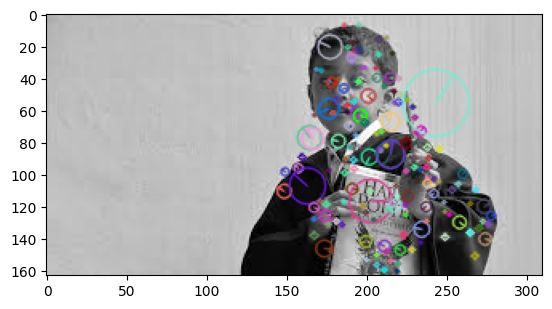

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_main = cv2.imread('/content/images (1).jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()
keypoints1 = sift.detect(img_main, None)

img_main = cv2.drawKeypoints(img_main,keypoints1,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img_main)
plt.show()


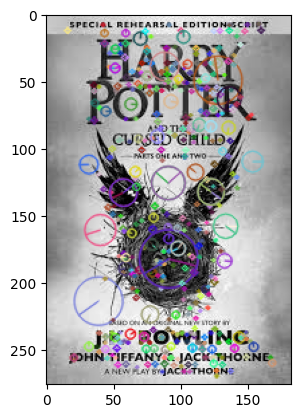

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_main_2 = cv2.imread('/content/images.jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()
keypoints1 = sift.detect(img_main_2, None)

img_main_2 = cv2.drawKeypoints(img_main_2,keypoints1,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img_main_2)
plt.show()


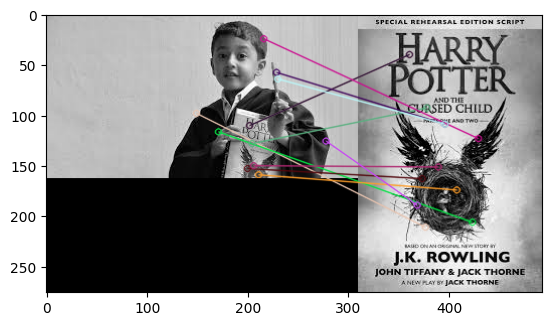

(<matplotlib.image.AxesImage at 0x783ca5079870>, None)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_main = cv2.imread('/content/images (1).jpg', cv2.IMREAD_GRAYSCALE)
img_main_2 = cv2.imread('/content/images.jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(img_main, None)
kp2, des2 = sift.detectAndCompute(img_main_2, None)

bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

good = []
for m,n in matches:
 if m.distance < 0.75*n.distance:
  good.append([m])
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(img_main,kp1,img_main_2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()



Using SIFT we can do image stitching as follows

1.  Detecting keypoints similar SIFT like finding DOG, Harris etc for all images
2. Find matching keypoint description beteween images
3. Using Ransac (similar to SVM) where you use 2 random points and the connect them and then check how many points within a small cylcindrical area of the line.
4. Applying transformation using homographic matrix





Stiching Images: ... 


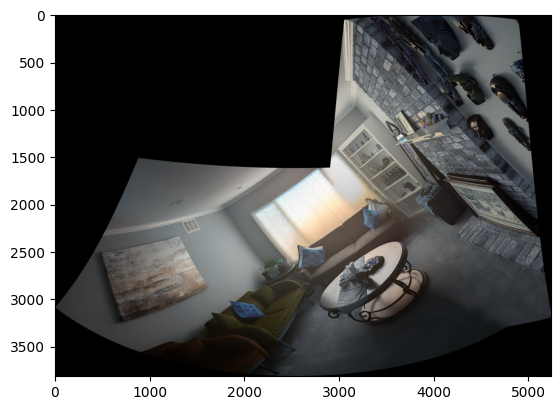

In [ ]:
from imutils import paths
import cv2
import numpy as np
import argparse
import imutils
import matplotlib.pyplot as plt

images = []
image_paths = ["/content/drive/MyDrive/Computer Vision/Texture Finding/Image Stitching/PXL_20240703_020718331.MP.jpg", "/content/drive/MyDrive/Computer Vision/Texture Finding/Image Stitching/PXL_20240703_020758428.jpg"]

for image_path in image_paths:
  image = cv2.imread(image_path)
  images.append(image)

print("Stiching Images: ... ")
stitcher = cv2.Stitcher_create()
(status, stitched) = stitcher.stitch(images)

if status == 0:
  plt.imshow(stitched)
  plt.show()


Local Binary Patterns

A very robust and fast way for texture anaylsis

LBP analyzes local texture by thresholding with n8 neighborhood of pixel ie for all pixels in neightborhood greater than or equal to center pixel those pixelss go to white (1) else it goes to 0. If we have 8 surrounding pixels we can have upto 2^8 or 256 combinations of 1s and 0s.

We can do this for all pixel in image in such a way that we can create a 8 bit number, just need to be careful in order we do it, for eg start from (x+1, y) and then go clockwise to get 8 bit number and we can replace pixel value with this 8 bit num

We can then create create a texture histogram across all 256 possible values

We can only get fine grained texture of images ie only 3x3 local features


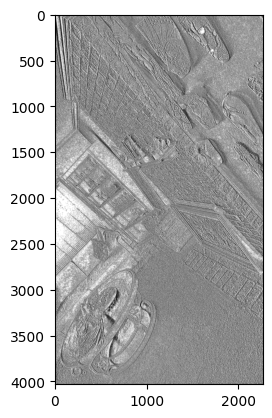

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def threshold_lbp(img, center, x, y):
  new_val = 0
  try:
    if (img[x][y] >= center):
      new_val = 1
  except:
    pass
  return new_val

def calculate_lbp_val(img, x, y):
  center = img[x][y]
  val_string = ""

  val_string = str(threshold_lbp(img, center, x+1, y)) + val_string
  val_string = str(threshold_lbp(img, center, x+1, y+1)) + val_string
  val_string = str(threshold_lbp(img, center, x, y+1)) + val_string
  val_string = str(threshold_lbp(img, center, x-1, y+1)) + val_string
  val_string = str(threshold_lbp(img, center, x-1, y)) + val_string
  val_string = str(threshold_lbp(img, center, x-1, y-1)) + val_string
  val_string = str(threshold_lbp(img, center, x, y-1)) + val_string
  val_string = str(threshold_lbp(img, center, x+1, y-1)) + val_string

  val = int(val_string,2)
  return val


img = cv2.imread("/content/drive/MyDrive/Computer Vision/Texture Finding/Image Stitching/PXL_20240703_020718331.MP.jpg")
height, width, _ = img.shape

lbp_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
lbp_img = np.zeros((height, width), np.uint8)

for i in range(height):
  for j in range(width):
    lbp_img[i][j] = calculate_lbp_val(lbp_gray, i, j)

plt.imshow(lbp_img, cmap = "gray")
plt.show()


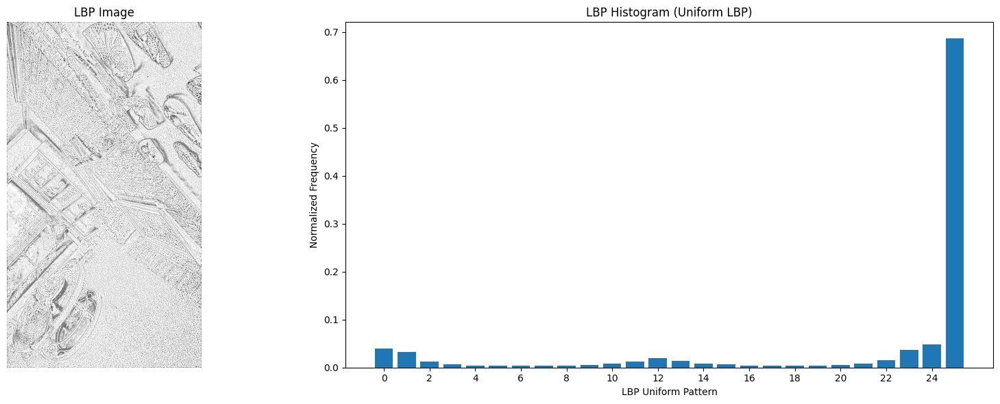

In [ ]:
from skimage import feature
import numpy as np

img = cv2.imread("/content/drive/MyDrive/Computer Vision/Texture Finding/Image Stitching/PXL_20240703_020718331.MP.jpg")
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


lpb_main = feature.local_binary_pattern(gray_img, 24, 8, method = "uniform")
(hist, _) = np.histogram(lpb_main.ravel(),bins=np.arange(0, 27),range=(0, 26))
hist = hist.astype("float")
hist /= (hist.sum() + 1e-7)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Display the LBP image
ax1.imshow(lpb_main, cmap='gray')
ax1.set_title('LBP Image')
ax1.axis('off')

# Display the histogram
ax2.bar(range(26), hist)
ax2.set_title('LBP Histogram (Uniform LBP)')
ax2.set_xlabel('LBP Uniform Pattern')
ax2.set_ylabel('Normalized Frequency')
ax2.set_xticks(range(0, 26, 2))

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


Grey Level CO-Occurence Matrix

This is a feature extractor that goes across the entire image unlike LBP and is especially useful for fine grained texture patters

We are basically try to find how often gray levels/intensities occur with image especially the neighborhood of a particlaur pixel. there are 3 main parameters
1. Distance : Distance between i and j pixel
2. Angle : Direction of Pixel - We perform GLCM only in 4 directions typically 0, 45, 90, 135
3. Number of Gray Levels: Number of different gray intensities in images/ surrounding area

Imagine a table with rows and columns labeled with all possible grayscale values (e.g., 0–255). Each cell represents the frequency with which a specific pair of gray levels co-occur at a given offset and direction. For example, if cell (50, 60) has a value of 20, it means that the gray level 50 occurs 20 times next to a pixel with intensity 60 at the specified offset and direction.

We then use these matrices with different angles and distances to characterize texture and structure within image:
1. Contrast : Difference between intensity of pixel and neighbor across whole img
2. Correlation: How related are a set of pixel values across image. high correaltion means predictablle pattern across whole image
3. Energy: Sum of squared elements - used to find uniformity within img, high energy means smooth texture, low vaues means varied texture
4. Homogenity: How close the distribution is to the distrubition along diagonal. High values mean that elements are more aloong the diagonal (smoothness along diagonal)


You can use these generated values for your whole training dataset in something like a pandas dataframe and apply machine learning algorithms on these calculated values to do classification and stuff

Contrast Horizontal:  [[84.65596085]]
Correlation Horizontal:  [[0.9870126]]
Energy Horizontal:  [[0.0211282]]
Homogeneity Horizontal:  [[0.32012989]]
Contrast Diagonal:  [[130.12126958]]
Correlation Diagonal:  [[0.98003931]]
Energy Diagonal:  [[0.01911561]]
Homogeneity Diagonal:  [[0.27217329]]
Contrast Vertical:  [[87.10248342]]
Correlation Vertical:  [[0.98664114]]
Energy Vertical:  [[0.02122732]]
Homogeneity Vertical:  [[0.32338247]]
Contrast Anti-Diagonal:  [[149.8195116]]
Correlation Anti-Diagonal:  [[0.97701758]]
Energy Anti-Diagonal:  [[0.01909972]]
Homogeneity Anti-Diagonal:  [[0.27366154]]


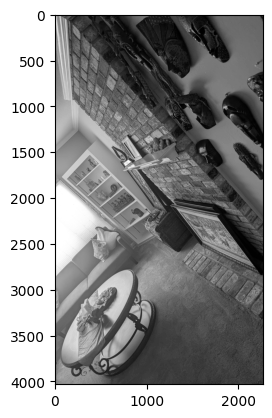

In [ ]:
from skimage.feature import graycomatrix, graycoprops
import numpy as np
import cv2

glcm_img = cv2.imread("/content/drive/MyDrive/Computer Vision/Texture Finding/Image Stitching/PXL_20240703_020718331.MP.jpg")
glcm_gray = cv2.cvtColor(glcm_img, cv2.COLOR_BGR2GRAY)

#glcm = graycomatrix(gray_image, pixel_offset, angle)
glcm = graycomatrix(glcm_gray, [1], [0])
contrast = graycoprops(glcm, 'contrast')
correlation = graycoprops(glcm, 'correlation')
energy = graycoprops(glcm, 'energy')
homogeneity = graycoprops(glcm, 'homogeneity')

print("Contrast Horizontal: ", contrast)
print("Correlation Horizontal: ", correlation)
print("Energy Horizontal: ", energy)
print("Homogeneity Horizontal: ", homogeneity)

glcm = graycomatrix(glcm_gray, [1], [np.pi/4])
contrast = graycoprops(glcm, 'contrast')
correlation = graycoprops(glcm, 'correlation')
energy = graycoprops(glcm, 'energy')
homogeneity = graycoprops(glcm, 'homogeneity')

print("Contrast Diagonal: ", contrast)
print("Correlation Diagonal: ", correlation)
print("Energy Diagonal: ", energy)
print("Homogeneity Diagonal: ", homogeneity)

glcm = graycomatrix(glcm_gray, [1], [np.pi/2])
contrast = graycoprops(glcm, 'contrast')
correlation = graycoprops(glcm, 'correlation')
energy = graycoprops(glcm, 'energy')
homogeneity = graycoprops(glcm, 'homogeneity')

print("Contrast Vertical: ", contrast)
print("Correlation Vertical: ", correlation)
print("Energy Vertical: ", energy)
print("Homogeneity Vertical: ", homogeneity)

glcm = graycomatrix(glcm_gray, [1], [3 * np.pi/4])
contrast = graycoprops(glcm, 'contrast')
correlation = graycoprops(glcm, 'correlation')
energy = graycoprops(glcm, 'energy')
homogeneity = graycoprops(glcm, 'homogeneity')

print("Contrast Anti-Diagonal: ", contrast)
print("Correlation Anti-Diagonal: ", correlation)
print("Energy Anti-Diagonal: ", energy)
print("Homogeneity Anti-Diagonal: ", homogeneity)

plt.imshow(glcm_gray, cmap="gray")

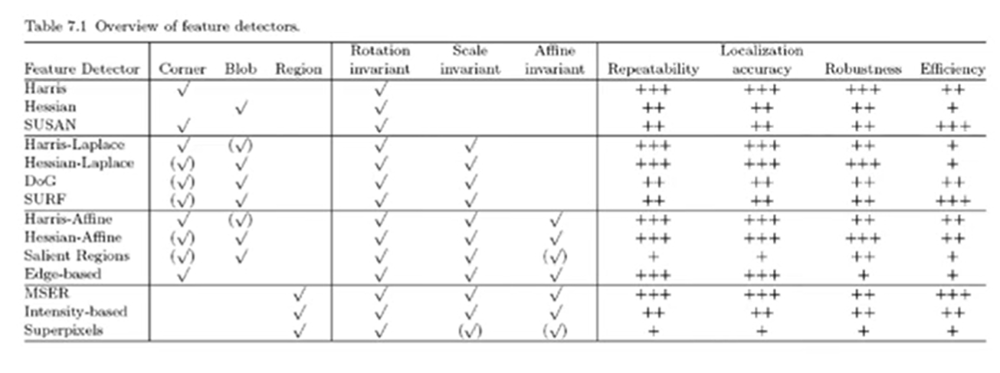

Barcode Detector

How do we detect a barcode
We know barcode have only alternating black and white straight lines so the obvious thing to use in this should be sobel edge detector

After doing this we will observe that the Y filter that finds vertical lines is usually better as barcodes are more likely to be veritical (They will be horizontal iff the object is held horizontally and we will attempt to deal with this)

We perform the following
1. Subtract Horizontal from Vertical as we will likely get the parts that are purely vertical
2. Vice versa as a backup

<ipython-input-3-05133ffd6090>:31: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box_with_padding = np.int0(box_with_padding)
<ipython-input-3-05133ffd6090>:35: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


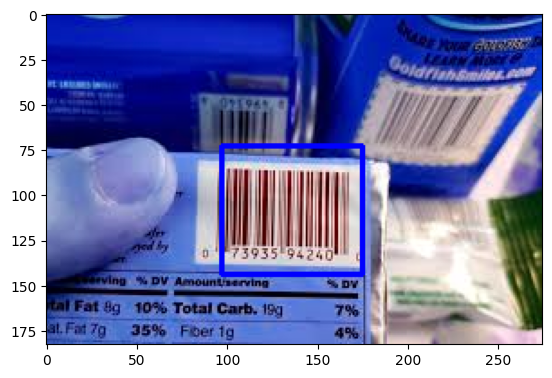

In [ ]:
barcodeImg = cv2.imread("/content/drive/MyDrive/Computer Vision/Barcodes/barcode1.jpg")
grayBarcode = cv2.cvtColor(barcodeImg, cv2.COLOR_BGR2GRAY)

# plt.imshow(sobelXBarcode, cmap="gray")
# plt.show()

sobelXBarcode = cv2.Sobel(grayBarcode, -1, dx=1, dy=0, ksize=1)
sobelYBarcode = cv2.Sobel(grayBarcode, -1, dx=0, dy=1, ksize=1)

verticalLines = cv2.subtract(sobelXBarcode, sobelYBarcode)
verticalLines = cv2.convertScaleAbs(verticalLines)

Blurredverticals = cv2.GaussianBlur(verticalLines, (5,5), 0)
_, verticalThresh = cv2.threshold(Blurredverticals, 70, 255, cv2.THRESH_BINARY)

# Now we should try to clump this into 1 big block so we want to close the gap
# But another thing we observe is width more than height
barcodeFinal = cv2.morphologyEx(verticalThresh, cv2.MORPH_CLOSE, np.ones((15,5), np.uint8))

# To get rid of the side blobs we have to first make the remaining blobs as thin as possible
# and then try to fill in the rest
# barcodeFinal = cv2.erode(barcodeFinal, np.ones((3,3), np.uint8), iterations = 4)
barcodeFinal = cv2.dilate(barcodeFinal, np.ones((5,5), np.uint8), iterations = 3)
#FInd contours of the barcode
barcodeCntrs = cv2.findContours(barcodeFinal, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
barcodeCntrs = imutils.grab_contours(barcodeCntrs)

#get largest contours and take largest
sortedBarcode = sorted(barcodeCntrs, key=cv2.contourArea, reverse=True)[0]
rect = cv2.minAreaRect(sortedBarcode)

# Get the new box points with padding
width = rect[1][0] + 15
height = rect[1][1] + 15
rect_with_padding = (rect[0], (width, height), rect[2])
box_with_padding = cv2.boxPoints(rect_with_padding)
box_with_padding = np.int0(box_with_padding)

# Get the new box points without padding
box = cv2.boxPoints(rect)
box = np.int0(box)


cv2.drawContours(barcodeImg, [box_with_padding], -1, (0,0,255), 2)

plt.imshow(barcodeImg)

# plt.imshow(verticalLines, cmap="gray")
plt.show()

A More Sophisticated Methodologi is available here:

https://oberhofer.co/how-barcode-localization-works-in-quaggajs/


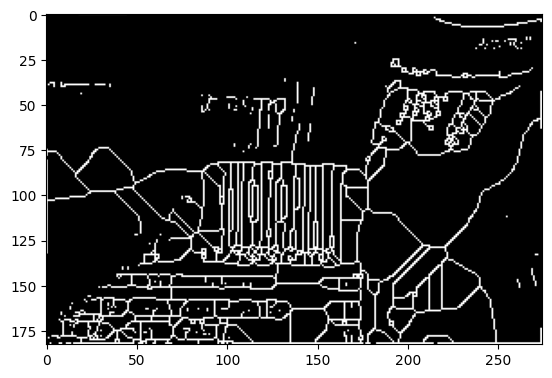

In [ ]:
def slicingImg(image):
  cell_height = 15
  cell_width = 20
  height, width = image.shape
  rows = height // cell_height
  cols = width // cell_width

  cells = []

  for i in range(rows):
    for j in range(cols):
      cell = image[i*cell_width: (i+1)*cell_width, j*cell_height: (j+1)*cell_height]
      cells.append(cell)
  return cells

  return img_thresh

def skeletonize(cell):
  copyImg = cell.copy()
  skel = np.zeros_like(cell)
  kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))

  while True:
      eroded = cv2.morphologyEx(copyImg, cv2.MORPH_ERODE, kernel)
      temp = cv2.morphologyEx(eroded, cv2.MORPH_DILATE, kernel)
      temp  = cv2.subtract(copyImg, temp)
      skel = cv2.bitwise_or(skel, temp)
      copyImg[:,:] = eroded[:,:]
      if cv2.countNonZero(copyImg) == 0:
        break

  return skel

barPath = cv2.imread("/content/drive/MyDrive/Computer Vision/Barcodes/barcode1.jpg")
barPath = cv2.cvtColor(barPath, cv2.COLOR_BGR2GRAY)
_, bar_thresh = cv2.threshold(barPath, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
cells = slicingImg(bar_thresh)

#Skeletonize
thinned = skeletonize(bar_thresh)

plt.imshow(thinned, cmap="gray")
plt.show()



OMR Checking

Step #1. Detect the exam in an image.

Step #2: Apply a perspective transform to extract the top-down, birds-eye-view of the exam.

Step #3: Extract the set of bubbles (i.e., the possible answer choices) from the perspective transformed exam.

Step #4: Sort the questions/bubbles into rows.

Step #5: Determine the marked (i.e., “bubbled in”) answer for each row.

Step #6: Lookup the correct answer in our answer key to determine if the user was correct in their choice.

Step #7: Repeat for all questions in the exam.





[INFO] score: 80.00%


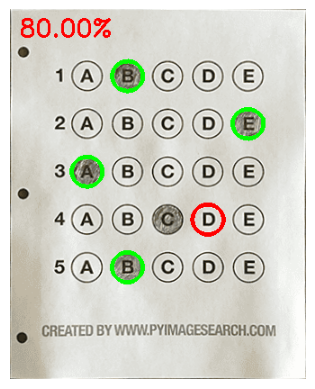

In [ ]:
import cv2
import imutils
import numpy as np
from imutils.perspective import four_point_transform
from imutils import contours
import matplotlib.pyplot as plt

ANSWER_KEY = {0: 1, 1: 4, 2: 0, 3: 3, 4: 1}

def detectExam(img):
    # Convert the image to grayscale and blur it
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 75, 200)

    # Find contours and select the biggest one
    cnts = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)

    for c in cnts:
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.02 * peri, True)
        if len(approx) == 4:
            return approx
    return None

def perspectiveTransform(img, paperContour):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply perspective transform and contours approx returns the 4 corners of
    # Image so we reshape into 4x2 format
    paper = four_point_transform(img, paperContour.reshape(4, 2))
    warped = four_point_transform(gray, paperContour.reshape(4, 2))

    bubbleContours, allContours, thresh = extractBubbles(warped)
    return paper, warped, bubbleContours, allContours, thresh

def extractBubbles(warped):
    # Threshold the warped image to binary
    thresh = cv2.threshold(warped, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    bubbleContours = []
    for c in cnts:
        (x, y, w, h) = cv2.boundingRect(c)
        ar = w / float(h)
        if 0.90 < ar < 1.1 and h >= 20 and w >= 20:
            bubbleContours.append(c)

    return bubbleContours, cnts, thresh

def getRowsAndCheck(paper, thresh, bubbles):
    bubbles = contours.sort_contours(bubbles, method="top-to-bottom")[0]
    correct = 0

    for (q, i) in enumerate(np.arange(0, len(bubbles), 5)):
        cnts = contours.sort_contours(bubbles[i:i + 5])[0]
        bubbled = None

        for (j, c) in enumerate(cnts):
            mask = np.zeros(thresh.shape, dtype="uint8")

            # Draw edges of bubble onto mask
            cv2.drawContours(mask, [c], -1, 255, -1)
            # We need only the inside part of the circle, not the edges
            mask = cv2.bitwise_and(thresh, thresh, mask=mask)
            total = cv2.countNonZero(mask)

            if bubbled is None or total > bubbled[0]:
                bubbled = (total, j)

        color = (0, 0, 255)
        k = ANSWER_KEY[q]
        if k == bubbled[1]:  # Compare with the index
            color = (0, 255, 0)
            correct += 1

        cv2.drawContours(paper, [cnts[k]], -1, color, 3)

    # Print the score on the sheet
    score = (correct / 5.0) * 100
    print("[INFO] score: {:.2f}%".format(score))
    cv2.putText(paper, "{:.2f}%".format(score), (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

    return paper

def main():
    img = cv2.imread("/content/drive/MyDrive/Computer Vision/omr_test_01.png")
    paperContour = detectExam(img)

    paper, warp, bubbles, allContours, thresh = perspectiveTransform(img, paperContour)
    paper = getRowsAndCheck(paper, thresh, bubbles)

    plt.imshow(cv2.cvtColor(paper, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Hide the axis
    plt.show()

main()


In [ ]:
def getRowsAndCheck(paper, thresh, bubbles):
  bubbles = contours.sort_contours(bubbles, method="top-to-bottom")[0]
  correct = 0

  for (q, i) in enumerate (np.arange(0, len(bubbles), 5)):
    cnts = contours.sort_contours(bubbles[i:i+5])[0]
    bubbled = None

    for (index, contour) in enumerate(cnts):
      mask = np.zeros(thresh.shape, dtype="uint8")

      #Draw edges of bubble onto mask
      cv2.drawContours(mask, [contour], -1, 255, -1)
      # we need only the inside part of the circle not the edges so
      mask = cv2.bitwise_and(thresh, thresh, mask=mask)
      total = cv2.countNonZero(mask)

      if bubbled is None or total > bubbled[0]:
        bubbled = (total, index) # Store the index of the bubbled contour

  color = (0,0,255)
  k = ANSWER_KEY[q]
  if k == bubbled[1]: # Now compare with the index
    color = (0,255,0)
    correct += 1

  cv2.drawContours(paper, [cnts[k]], -1, color, 3)


  #Printing onto sheet
  score = (correct / 5.0) * 100
  print("[INFO] score: {:.2f}%".format(score))
  cv2.putText(paper, "{:.2f}%".format(score), (10, 30),
	cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

  return paper

Finding Distances within objects in Open CV

1. We need to find distance between associated corners ie if we have say 2 rectangles and we need to find the distance between these point we will find the distance between the top lefts of both, then the top rights,Bottom right and the bottom left.           **For this we need to know how to order these points in that particular order before finding Distance**

2. Based on a reference image we should be able to find the size of all other objects in image (Bounding box). We assume something unique about our reference image for example its the left most object in out image. We find correspoinding distance by using a pixel/metric ratio.


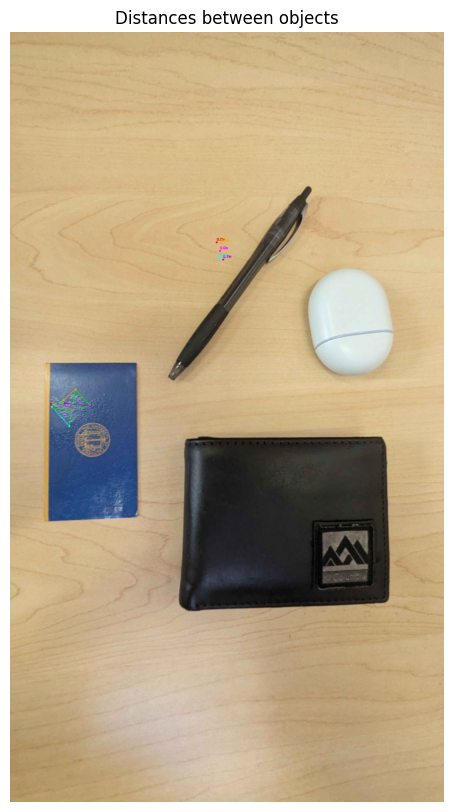

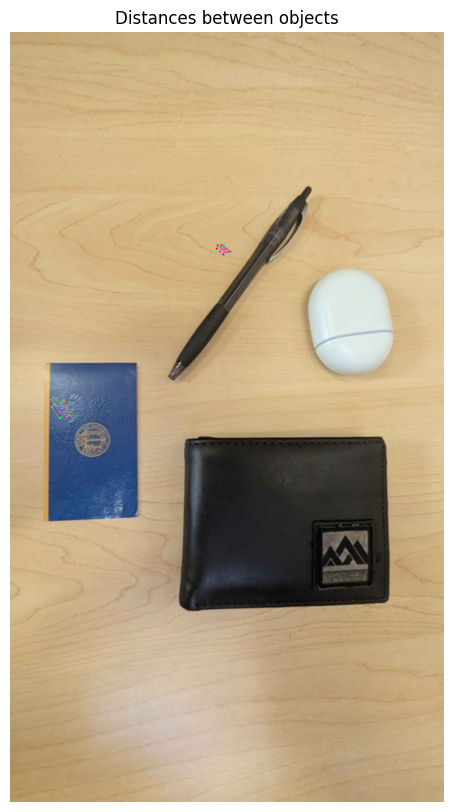

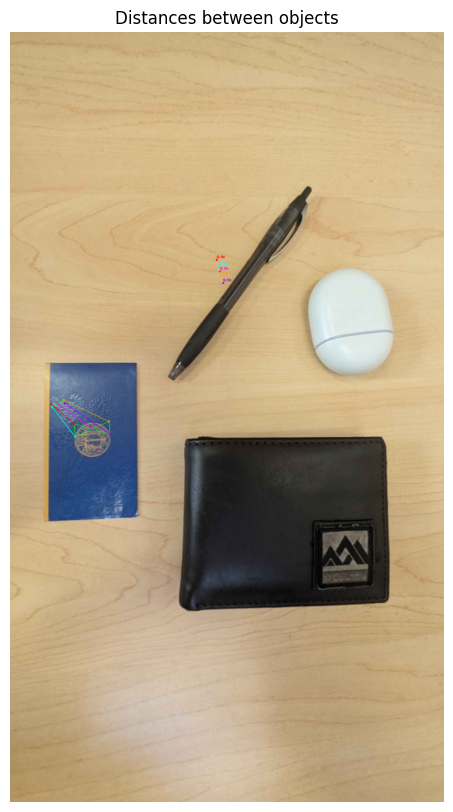

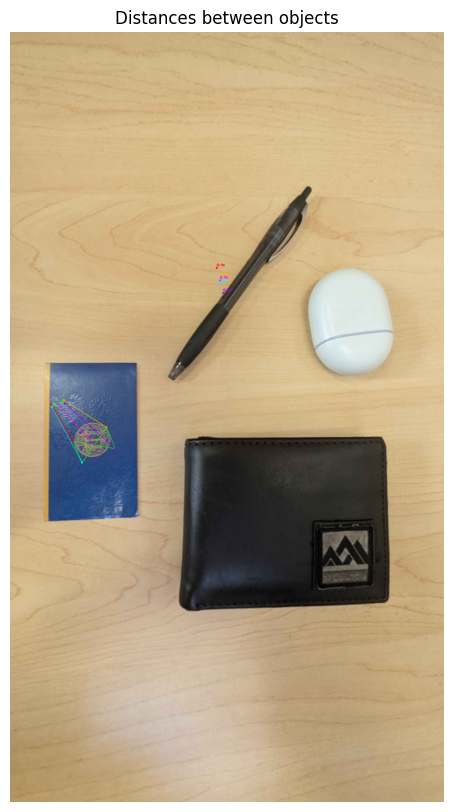

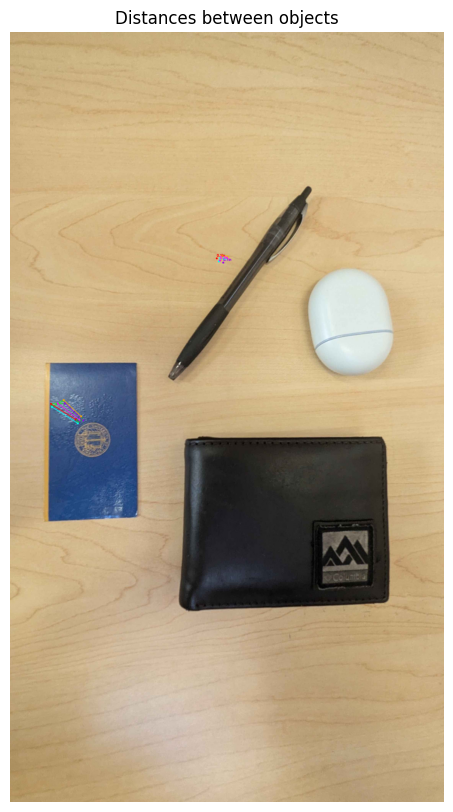

...

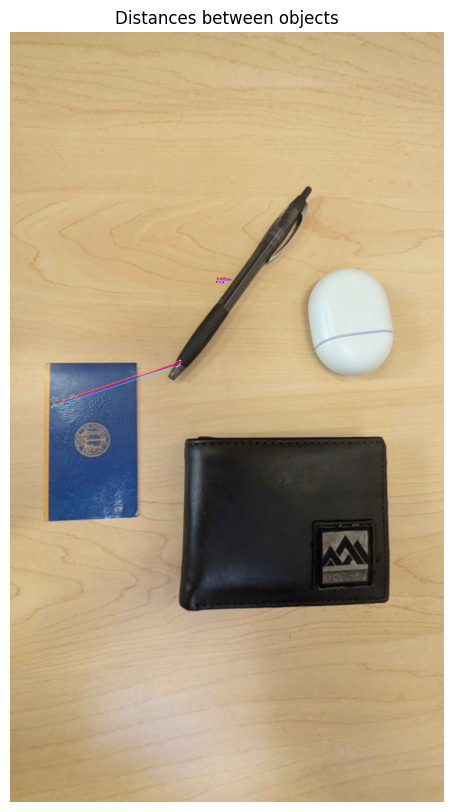

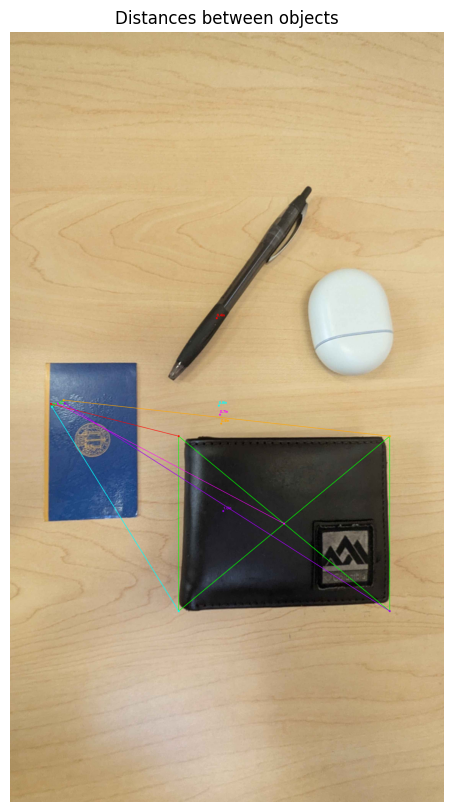

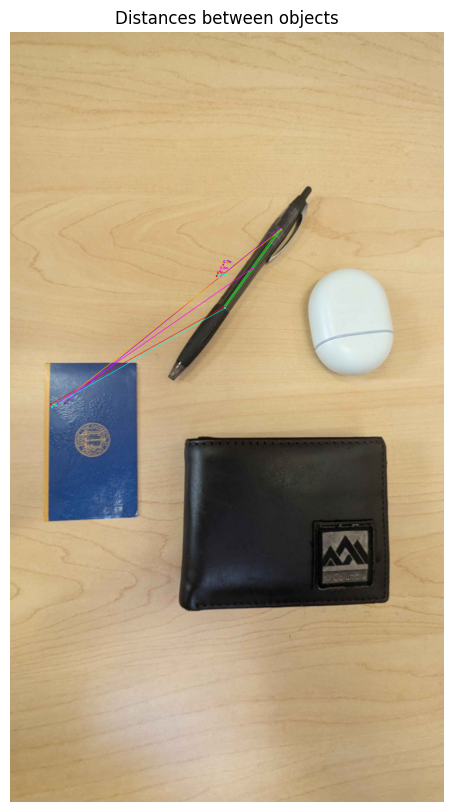

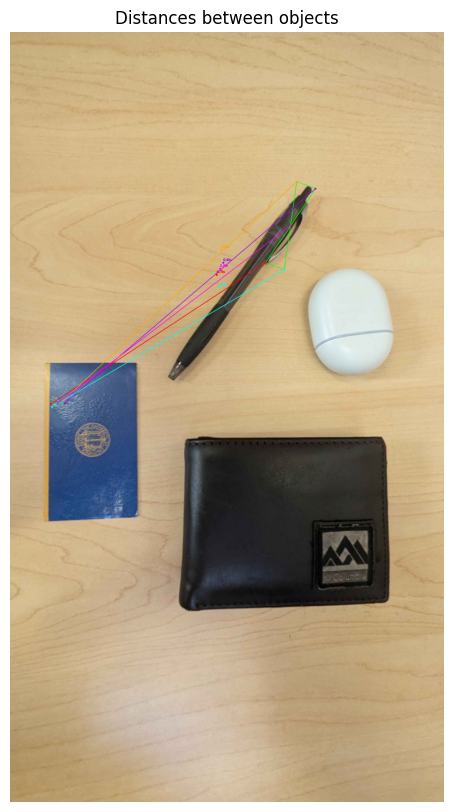

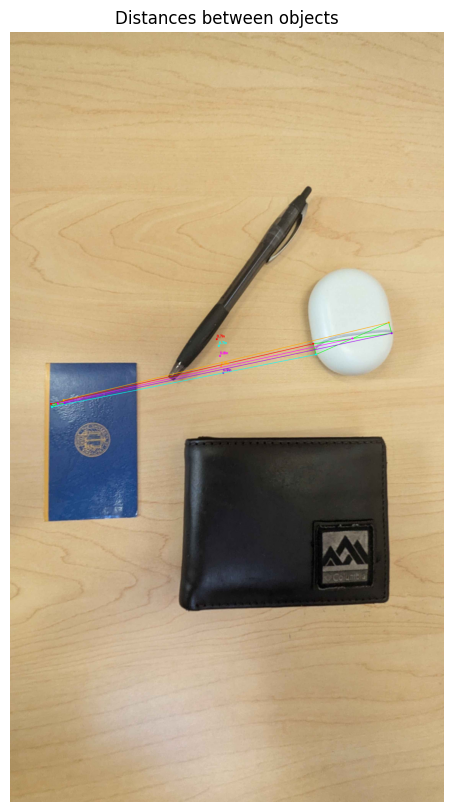

In [ ]:
from scipy.spatial import distance as dist

def order_points(pts):
  # Sorting points based on x coordinates
  xSorted = pts[np.argsort(pts[:, 0]), :]

  #Taking 2 left most and 2 right most
  leftX = xSorted[:2, :]
  rightX = xSorted[2:, :]

  #Sort left most 2 points based on x coordinates
  leftXSorted = leftX[np.argsort(leftX[:, 1]), :]
  (tl, bl) = leftXSorted

  #Now we use pythagoras theorem to find lesser of distances from
  # remaining 2 points to get tr and br
  D = dist.cdist(tl[np.newaxis], rightX, "euclidean")[0]
  (tr, br) = rightX[np.argsort(D)[::-1], :]

  return np.array([tl, tr, br, bl], dtype="float32")

def findMidpoints(first, second):
  mid1 = (first[0] + first[1]) / 2
  mid2 = (second[0] + second[1]) / 2
  return mid1, mid2

def calculate_sizes(img_path, width):
  img = cv2.imread(img_path)
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)
  edges = cv2.Canny(img_blur, 50,100)
  edges = cv2.dilate(edges, None, iterations=1)
  edges = cv2.erode(edges, None, iterations=1)

  cnts = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  (cnts, _) = contours.sort_contours(cnts)

  pixelPerMetric = None

  for c in cnts:
    if cv2.contourArea(c) < 100:
      continue

    # Get bounding box of contour
    copyImg = img.copy()
    box = cv2.minAreaRect(c)
    box = cv2.boxPoints(box)
    box = np.array(box, dtype="int")
    box = order_points(box)
    cv2.drawContours(copyImg, [box.astype("int")], -1, (0, 255, 0), 2)

    for (x, y) in box:
      cv2.circle(copyImg, (int(x), int(y)), 5, (0, 0, 255), -1)

    (tl, tr, br, bl) = box

    #Finding all midpoints

    midTopX, midTopY = findMidpoints(tl, tr)
    midBottomX, midBottomY = findMidpoints(bl, br)
    midLeftX, midLeftY = findMidpoints(tl, bl)
    midRightX, midRightY = findMidpoints(tr, br)
    cv2.circle(copyImg, (int(midTopX), int(midTopY)), 5, (255, 0, 0), -1)
    cv2.circle(copyImg, (int(midBottomX), int(midBottomY)), 5, (255, 0, 0), -1)
    cv2.circle(copyImg, (int(midLeftX), int(midLeftY)), 5, (255, 0, 0), -1)
    cv2.circle(copyImg, (int(midRightX), int(midRightY)), 5, (255, 0, 0), -1)

    #Draw lines between midpoints
    cv2.line(copyImg, (int(midTopX), int(midTopY)), (int(midBottomX), int(midBottomY)), (0, 255, 0), 2)
    cv2.line(copyImg, (int(midLeftX), int(midLeftY)), (int(midRightX), int(midRightY)), (0, 255, 0), 2)

    #Finding size of Image
    contourHeight = dist.euclidean((midTopX, midTopY), (midBottomX, midBottomY))
    contourWidth = dist.euclidean((midLeftX, midLeftY), (midRightX, midRightY))

    if pixelsPerMetric is None:
      pixelsPerMetric = contourWidth / width

    lenHeight = contourHeight / pixelsPerMetric
    lenWidth = contourWidth / pixelsPerMetric

    cv2.putText(copyImg, "{:.1f}in".format(contourHeight),
		(int(midTopX - 15), int(midTopY - 10)), cv2.FONT_HERSHEY_SIMPLEX,
		0.65, (255, 255, 255), 2)

    cv2.putText(copyImg, "{:.1f}in".format(contourWidth),
		(int(midRightX + 10), int(midRightY)), cv2.FONT_HERSHEY_SIMPLEX,
		0.65, (255, 255, 255), 2)


def distBetweenObjects (img_path, width):
  img = cv2.imread(img_path)
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)
  edges = cv2.Canny(img_blur, 50,100)
  edges = cv2.dilate(edges, None, iterations=1)
  edges = cv2.erode(edges, None, iterations=1)

  cnts = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  (cnts, _) = contours.sort_contours(cnts)
  colors = ((0, 0, 255), (240, 0, 159), (0, 165, 255), (255, 255, 0),
	(255, 0, 255))
  refObject = None

  for c in cnts:
    if cv2.contourArea(c) < 100:
      continue

    box = cv2.minAreaRect(c)
    box = cv2.boxPoints(box)
    box = np.array(box, dtype="int")
    box = order_points(box)
    boxCenterX = np.average(box[:, 0])
    boxCenterY = np.average(box[:, 1])

    if refObject == None:
      (tl, tr, br, bl) = box
      midLeftX, midLeftY = findMidpoints(tl, bl)
      midRightX, midRightY = findMidpoints(tr, br)
      D = dist.euclidean((midLeftX, midLeftY), (midRightX, midRightY))
      refObject = (box, boxCenterX, boxCenterY, D/width)
      continue

    orig = img.copy()
    cv2.drawContours(orig, [box.astype("int")], -1, (0, 255, 0), 2)
    cv2.drawContours(orig, [refObject[0].astype("int")], -1, (0, 255, 0), 2)
	  # stack the reference coordinates and the object coordinates
	  # to include the object center
    refCoords = np.vstack([refObject[0], [refObject[1], refObject[2]]])
    objCoords = np.vstack([box, (boxCenterX, boxCenterY)])

    for ((xRef, yRef), (xObj, yObj), color) in zip(refCoords, objCoords, colors):
      cv2.circle(orig, (int(xRef), int(yRef)), 5, color, -1)
      cv2.circle(orig, (int(xObj), int(yObj)), 5, color, -1)
      cv2.line(orig, (int(xRef), int(yRef)), (int(xObj), int(yObj)),color, 2)

      D = dist.euclidean((xRef, yRef), (xObj, yObj)) / refObject[2]
      midX, midY = findMidpoints((xRef, yRef), (xObj, yObj))
      cv2.circle(orig, (int(midX), int(midY)), 5, color, -1)

      cv2.putText(orig, "{:.1f}in".format(D), (int(midX), int(midY - 10)),
			cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)

      orig_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)

    # Plot the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(orig_rgb)
    plt.title('Distances between objects')
    plt.axis('off')
    plt.show()


distBetweenObjects("/content/drive/MyDrive/Computer Vision/objectDistance.jpg", 2.0)

Number Plate detector application:

1. Need to figure out car shapes within image
  1. Detecting Cars within images/Videos using harr cascade
  
2. Detect the number plate within the image
  1. We need to figure out how to isolate only the number plate from the frame of the car. Some things we know about this is that :
    1. They are rectangular in shape likely much wider the height
    2. Usually white with black letters
    3. They are near the bottom half of the car

Text(0.5, 1.0, 'Harris Corners')

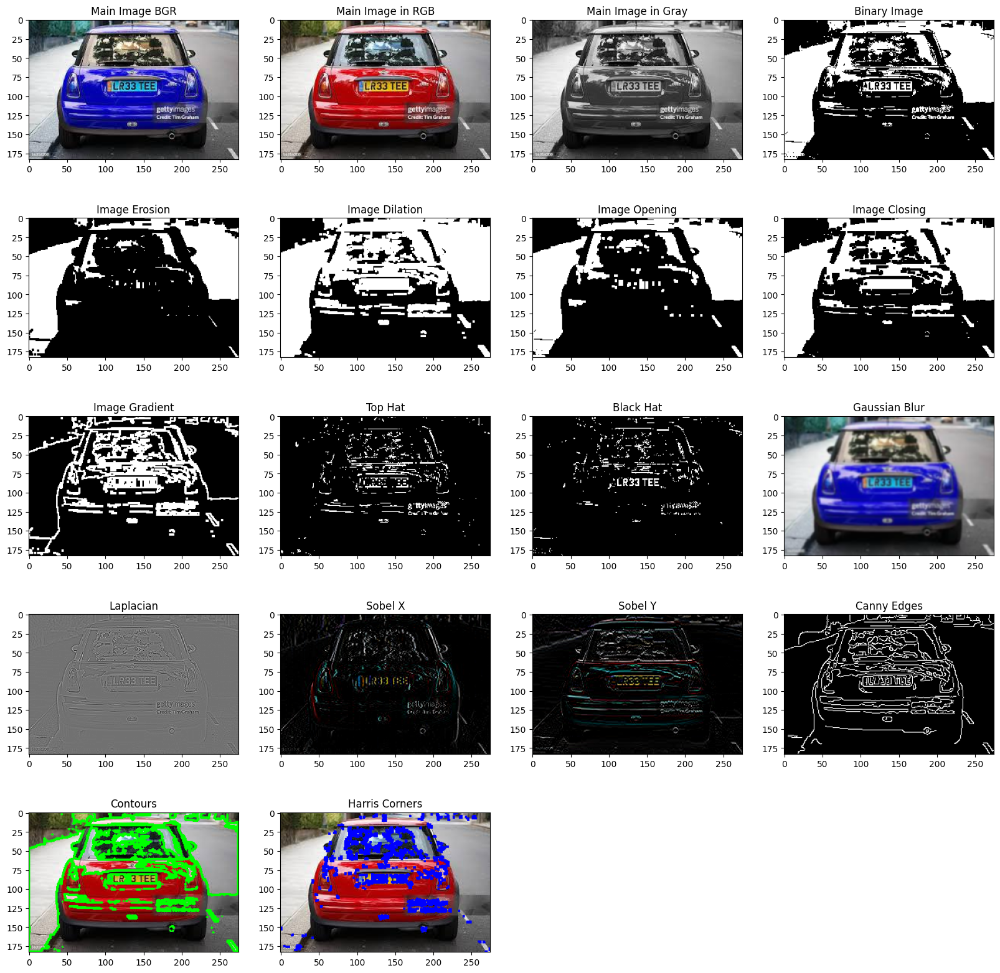

In [ ]:

fig = plt.figure(figsize=(20,20))

row = 5
column = 4


# Open Cv inputs all images in BRG
car_img = cv2.imread('/content/drive/MyDrive/Computer Vision/Number plate/plates4.jpg')
ax1 = fig.add_subplot(row, column, 1)
ax1.imshow(car_img)
ax1.set_title('Main Image BGR')


#RGB img
car_rgb  = cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)
ax2 = fig.add_subplot(row, column, 2)
ax2.imshow(car_rgb)
ax2.set_title('Main Image in RGB')

# Gray Image
car_gray = cv2.cvtColor(car_img, cv2.COLOR_BGR2GRAY)
ax3 = fig.add_subplot(row, column, 3)
ax3.imshow(car_gray, cmap = "gray")
ax3.set_title('Main Image in Gray')

#Binary Image
ret, car_thresh = cv2.threshold(car_gray, 127, 255, cv2.THRESH_BINARY)
ax4 = fig.add_subplot(row, column, 4)
ax4.imshow(car_thresh, cmap = "gray")
ax4.set_title('Binary Image')

#kernel to perform morphological operations on
kernel = np.ones((3,3), np.uint8)

#Image Erosion
car_eroded = cv2.erode(car_thresh, kernel, iterations=1)
ax5 = fig.add_subplot(row, column, 5)
ax5.imshow(car_eroded, cmap = "gray")
ax5.set_title('Image Erosion')

#Image Dilation
car_dilated = cv2.dilate(car_thresh, kernel, iterations=1)
ax6 = fig.add_subplot(row, column, 6)
ax6.imshow(car_dilated, cmap = "gray")
ax6.set_title('Image Dilation')

#Image Opening
car_opening = cv2.morphologyEx(car_thresh, cv2.MORPH_OPEN, kernel)
ax7 = fig.add_subplot(row, column, 7)
ax7.imshow(car_opening, cmap = "gray")
ax7.set_title('Image Opening')

#Imagge Closing
car_closing = cv2.morphologyEx(car_thresh, cv2.MORPH_CLOSE, kernel)
ax8 = fig.add_subplot(row, column, 8)
ax8.imshow(car_closing, cmap = "gray")
ax8.set_title('Image Closing')

#Image Gradient
car_Gradient = cv2.morphologyEx(car_thresh, cv2.MORPH_GRADIENT, kernel)
ax9 = fig.add_subplot(row, column, 9)
ax9.imshow(car_Gradient, cmap = "gray")
ax9.set_title('Image Gradient')

#Top Hat
car_top_hat = cv2.morphologyEx(car_thresh, cv2.MORPH_TOPHAT, kernel)
ax10 = fig.add_subplot(row, column, 10)
ax10.imshow(car_top_hat, cmap = "gray")
ax10.set_title('Top Hat')

#Black Hat
car_black_hat = cv2.morphologyEx(car_thresh, cv2.MORPH_BLACKHAT, kernel)
ax11 = fig.add_subplot(row, column, 11)
ax11.imshow(car_black_hat, cmap = "gray")
ax11.set_title('Black Hat')

# Gaussian Blur
car_blur = cv2.GaussianBlur(car_img, (5,5), 0)
ax12 = fig.add_subplot(row, column, 12)
ax12.imshow(car_blur)
ax12.set_title('Gaussian Blur')


#Laplacian
car_laplacian = cv2.Laplacian(car_gray, cv2.CV_64F)
ax13 = fig.add_subplot(row, column, 13)
ax13.imshow(car_laplacian, cmap = "gray")
ax13.set_title('Laplacian')

#Sobel_X
car_edgesx = cv2.Sobel(car_rgb, -1, dx=1, dy=0, ksize=1)
ax14 = fig.add_subplot(row, column, 14)
ax14.imshow(car_edgesx, cmap = "gray")
ax14.set_title('Sobel X')

#Sobel Y
car_edgesy = cv2.Sobel(car_rgb, -1, dx=0, dy=1, ksize=1)
ax15 = fig.add_subplot(row, column, 15)
ax15.imshow(car_edgesy, cmap = "gray")
ax15.set_title('Sobel Y')


#canny edges
car_canny = cv2.Canny(car_blur, 100, 200)
ax16 = fig.add_subplot(row, column, 16)
ax16.imshow(car_canny, cmap = "gray")
ax16.set_title('Canny Edges')

#Contours
car_countours, car_heirarchy = cv2.findContours(car_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_car = car_rgb.copy()
cv2.drawContours(contour_car, car_countours, -1, (0,255,0), 2)
ax17 = fig.add_subplot(row, column, 17)
ax17.imshow(contour_car)
ax17.set_title('Contours')

#harris Corners
gray_float = np.float32(car_gray)
dst = cv2.cornerHarris(gray_float, 2, 3, 0.04)
dst = cv2.dilate(dst, None)
car_rgb[dst > 0.01 * dst.max()] = [0, 0, 255]
ax18 = fig.add_subplot(row, column, 18)
ax18.imshow(car_rgb)
ax18.set_title('Harris Corners')


#INcrease space between all plots



What we tried to do is figure out which morphological operation is best for isolating the number plate from the car, So using the precious code and a bunch of test images what we observe is that there are 3 main operations that can help us identity the number plate.
  1. Dilation
  2. Closing
  3. Black Hat - Essential closing

The next thing we can try is to isolate which of these 3 is best
We do this by changin the other parameter ie the kernerl size
we tries 3x3, so now we try a few more like 5x5, 10x5, 15x5.

After doing this we observe that black hat gives us the clearest response for what part of the car is the license plate.

But to only isolate the license plate we need to perform more preproocessing

processing /content/drive/MyDrive/Computer Vision/Number plate/plates2.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates3.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates4.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates5.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates6.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates7.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates8.jpg
processing /content/drive/MyDrive/Computer Vision/Number plate/plates9.jpg


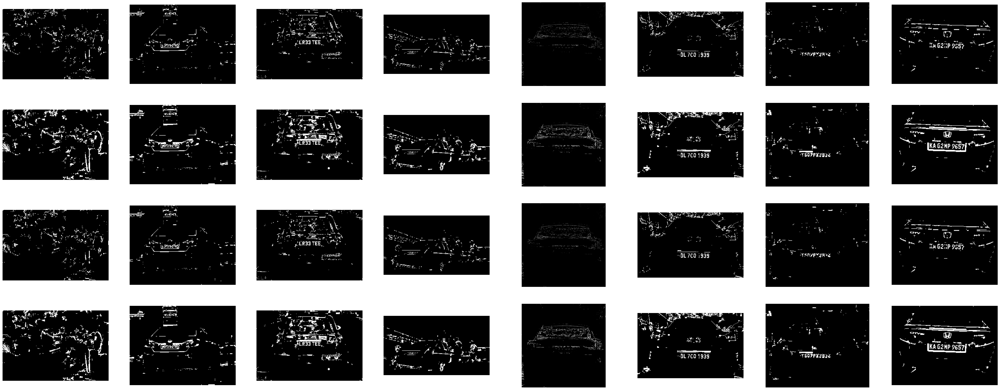

In [ ]:
fig = plt.figure(figsize=(50,50))
fig.tight_layout()

rows = 10
columns = 8

# We try all our morpholgical operations to see which one helps
# Most License Plates are rectangular with a small height and large width
kernel = np.ones((3,3), np.uint8)
kernel_2 = np.ones((5,5), np.uint8)
kernel_3 = np.ones((10,5), np.uint8)
kernel_4 = np.ones((15,5), np.uint8)




for i in range (2, 10):
  img_path = "/content/drive/MyDrive/Computer Vision/Number plate/plates" + str(i) + ".jpg"
  print(f"processing {img_path}")
  plates = cv2.imread(img_path)
  plates_grayed = cv2.cvtColor(plates, cv2.COLOR_BGR2GRAY)
  ret, platesCheckThresh = cv2.threshold(plates_grayed, 127, 255, cv2.THRESH_BINARY)


  plates_eroded = cv2.morphologyEx(platesCheckThresh, cv2.MORPH_BLACKHAT, kernel)
  plates_eroded_2 = cv2.morphologyEx(platesCheckThresh, cv2.MORPH_BLACKHAT, kernel_2)
  plates_eroded_3 = cv2.morphologyEx(platesCheckThresh, cv2.MORPH_BLACKHAT, kernel_3)
  plates_eroded_4 = cv2.morphologyEx(platesCheckThresh, cv2.MORPH_BLACKHAT, kernel_4)

  ax1 = fig.add_subplot(rows, columns, i-1)
  ax1.imshow(plates_eroded, cmap="gray")
  ax1.axis('off')

  ax2 = fig.add_subplot(rows, columns, i+7)
  ax2.imshow(plates_eroded_2, cmap="gray")
  ax2.axis('off')


  ax3 = fig.add_subplot(rows, columns, i+15)
  ax3.imshow(plates_eroded, cmap="gray")
  ax3.axis('off')

  ax4 = fig.add_subplot(rows, columns, i+23)
  ax4.imshow(plates_eroded_2, cmap="gray")
  ax4.axis('off')



plt.show()


